### Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv('/kaggle/input/datasets/leofire123/indian-flight-delay-datasets/india_flight_delay_model_input.csv')

### Understanding the Data

In [3]:
df.head()

,Flight_Date,Airline,Flight_Number,Origin_Airport,Destination_Airport,Scheduled_Departure_Hour,Scheduled_Departure_Minute,Day_of_Week,Month,Is_Weekend,...,Humidity_pct,Wind_Speed_kmh,Visibility_km,Rainfall_mm,Cloud_Cover_pct,Origin_Congestion_Index,Previous_Flight_Delay_Minutes,Turnaround_Risk_Index,Departure_Delay,Delay_Target
0,2025-12-04,IndiGo,IN8723,BOM,DEL,13,57,3,12,0,...,46.1,4.3,9.8,5.2,0.0,63.5,0,23.9,43,1
1,2024-01-15,IndiGo,IN558,CCU,HYD,19,14,0,1,0,...,70.5,8.9,11.7,0.4,39.8,95.3,1,31.5,49,1
2,2023-11-06,Vistara,VI4949,HYD,DEL,8,50,0,11,0,...,53.7,7.8,9.6,4.3,16.6,100.0,1,41.5,73,1
3,2025-08-08,SpiceJet,SP3196,BLR,DIB,11,56,4,8,0,...,42.0,1.5,12.6,4.6,23.6,51.1,1,28.2,40,1
4,2023-09-09,IndiGo,IN8458,BLR,JGA,22,59,5,9,1,...,58.5,1.3,11.3,3.5,36.2,67.0,0,27.9,0,0


In [4]:
df.columns

Index(['Flight_Date', 'Airline', 'Flight_Number', 'Origin_Airport',
       'Destination_Airport', 'Scheduled_Departure_Hour',
       'Scheduled_Departure_Minute', 'Day_of_Week', 'Month', 'Is_Weekend',
       'Peak_Hour', 'Weather', 'Temperature_C', 'Humidity_pct',
       'Wind_Speed_kmh', 'Visibility_km', 'Rainfall_mm', 'Cloud_Cover_pct',
       'Origin_Congestion_Index', 'Previous_Flight_Delay_Minutes',
       'Turnaround_Risk_Index', 'Departure_Delay', 'Delay_Target'],
      dtype='object')

In [5]:
df.isnull().sum()

Flight_Date                      0
Airline                          0
Flight_Number                    0
Origin_Airport                   0
Destination_Airport              0
Scheduled_Departure_Hour         0
Scheduled_Departure_Minute       0
Day_of_Week                      0
Month                            0
Is_Weekend                       0
Peak_Hour                        0
Weather                          0
Temperature_C                    0
Humidity_pct                     0
Wind_Speed_kmh                   0
Visibility_km                    0
Rainfall_mm                      0
Cloud_Cover_pct                  0
Origin_Congestion_Index          0
Previous_Flight_Delay_Minutes    0
Turnaround_Risk_Index            0
Departure_Delay                  0
Delay_Target                     0
dtype: int64

In [6]:
df.describe()

,Scheduled_Departure_Hour,Scheduled_Departure_Minute,Day_of_Week,Month,Is_Weekend,Peak_Hour,Temperature_C,Humidity_pct,Wind_Speed_kmh,Visibility_km,Rainfall_mm,Cloud_Cover_pct,Origin_Congestion_Index,Previous_Flight_Delay_Minutes,Turnaround_Risk_Index,Departure_Delay,Delay_Target
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.00000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,14.001260,29.533773,2.997107,6.512973,0.286820,0.47528,27.028051,56.332991,5.993765,10.891581,1.666205,25.013692,72.406212,6.170807,35.715187,42.664340,0.866167
std,5.480291,17.322034,2.003977,3.445167,0.452278,0.49939,5.489234,10.161597,4.223185,1.271557,2.409718,13.020552,19.277706,6.483483,8.719541,19.016712,0.340474
min,5.000000,0.000000,0.000000,1.000000,0.000000,0.00000,10.000000,20.000000,0.000000,5.100000,0.000000,0.000000,0.000000,0.000000,0.400000,0.000000,0.000000
25%,9.000000,15.000000,1.000000,4.000000,0.000000,0.00000,22.900000,49.500000,2.900000,10.000000,0.000000,15.800000,60.900000,1.000000,29.900000,39.000000,1.000000
50%,14.000000,30.000000,3.000000,7.000000,0.000000,0.00000,27.000000,56.300000,5.000000,10.900000,0.600000,24.800000,72.700000,4.000000,35.700000,47.000000,1.000000
75%,19.000000,45.000000,5.000000,10.000000,1.000000,1.00000,31.100000,63.200000,8.100000,11.700000,2.500000,33.800000,88.800000,9.000000,41.500000,54.000000,1.000000
max,23.000000,59.000000,6.000000,12.000000,1.000000,1.00000,45.000000,100.000000,35.000000,15.000000,30.400000,90.100000,100.000000,71.000000,88.200000,119.000000,1.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 23 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Flight_Date                    150000 non-null  object 
 1   Airline                        150000 non-null  object 
 2   Flight_Number                  150000 non-null  object 
 3   Origin_Airport                 150000 non-null  object 
 4   Destination_Airport            150000 non-null  object 
 5   Scheduled_Departure_Hour       150000 non-null  int64  
 6   Scheduled_Departure_Minute     150000 non-null  int64  
 7   Day_of_Week                    150000 non-null  int64  
 8   Month                          150000 non-null  int64  
 9   Is_Weekend                     150000 non-null  int64  
 10  Peak_Hour                      150000 non-null  int64  
 11  Weather                        150000 non-null  object 
 12  Temperature_C                 

In [8]:
numeric = df.select_dtypes(int,float).columns
print("numeric cols are : " , numeric)

numeric cols are :  Index(['Scheduled_Departure_Hour', 'Scheduled_Departure_Minute', 'Day_of_Week',
       'Month', 'Is_Weekend', 'Peak_Hour', 'Previous_Flight_Delay_Minutes',
       'Departure_Delay', 'Delay_Target'],
      dtype='object')


In [9]:
categoric = df.select_dtypes(object).columns
print("categoric cols are : ", categoric)

categoric cols are :  Index(['Flight_Date', 'Airline', 'Flight_Number', 'Origin_Airport',
       'Destination_Airport', 'Weather'],
      dtype='object')


### Visualizations

In [33]:
from ydata_profiling import ProfileReport

profile = ProfileReport(
    df,
    title="Indian flight delay data profiling report",
    # 1. Use an empty list [] instead of None to turn off multi-variable scatter plots
    interactions={"targets": []}, 
    # 2. Skip heavy text/categorical correlation calculations
    correlations={
        "auto": {"calculate": True},
        "cramers": {"calculate": False},
        "phi_k": {"calculate": False}
    }
)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 23/23 [00:03<00:00,  7.58it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

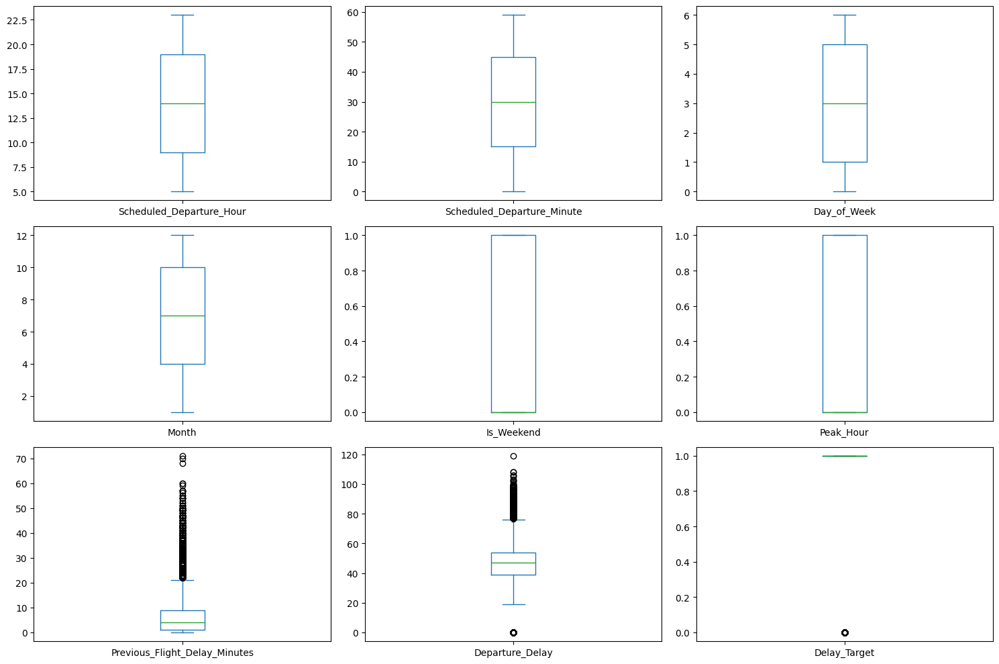

In [38]:
df[numeric].plot(kind='box', subplots=True, layout=(-1, 3), figsize=(15, 10))
plt.tight_layout()
plt.show()

In [ ]:
for col in categoric:
    num_unique = df[col].nunique()
        if num_unique > 10:
        plot_categories = df[col].value_counts().head(10).index
        filtered_df = df[df[col].isin(plot_categories)]
        title_prefix = "Top 10 Most Frequent"
    else:
        plot_categories = df[col].value_counts().index
        filtered_df = df
        title_prefix = "All Categories"
    
    plt.figure(figsize=(10, 5))
    sns.countplot(
        data=filtered_df, 
        y=col, 
        order=plot_categories,
        palette="Blues_r"
    )
    
    plt.title(f"{title_prefix} in {col} (Total Unique: {num_unique})", fontsize=12, weight='bold')
    plt.xlabel("Number of Flights")
    plt.ylabel(col)
    
    plt.tight_layout()
    plt.show()